In [1]:
import pandas as pd
import sys


sys.path.append('../../')
from src.plot_helpers import plot_experiment_range,plot_correlation_matrix
from src.transform import transform_diff_avg,load_json

ls = load_json("../../json/locations.json")["ls"]

## Load data

In [2]:
df = pd.read_csv('../../data/clean_data/all_sensors.csv',index_col=0,parse_dates=True)
df

/tmp/ipykernel_2034317/2544046345.py:1: DtypeWarning: Columns (6,26) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../../data/clean_data/all_sensors.csv',index_col=0,parse_dates=True)


,aqi_palas,averaging,cn,co,co2,dcn,formaldehyde,global_error,humidity,indoor_nox_index,...,temperature,tvoc,tvoc_ppb,voc,volume_flow,x10_dcn,x16_dcn,x50_dcn,x84_dcn,x90_dcn
2024-10-11 13:24:18,NaN,NaN,NaN,NaN,566.00,NaN,3.0,NaN,58.00,NaN,...,20.50,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:33:57,NaN,NaN,NaN,NaN,528.00,NaN,11.0,NaN,58.00,NaN,...,21.00,87.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:43:57,NaN,NaN,NaN,NaN,596.00,NaN,36.0,NaN,57.00,NaN,...,22.20,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:44:34,NaN,NaN,NaN,NaN,675.00,NaN,42.0,NaN,57.00,NaN,...,22.70,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:54:27,NaN,NaN,NaN,NaN,701.00,NaN,41.0,NaN,57.00,NaN,...,23.00,102.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-05 16:17:00,56.47,60.0,1112.10,NaN,996.77,->,NaN,0.0,51.54,NaN,...,22.17,NaN,NaN,0.06,1.0,0.19,0.2,0.24,0.3,0.34
2024-11-05 16:18:00,58.78,60.0,1140.10,NaN,1025.73,->,NaN,0.0,50.25,NaN,...,22.78,NaN,NaN,0.09,1.0,0.19,0.2,0.24,0.3,0.33
2024-11-05 16:19:00,60.80,60.0,1142.41,NaN,1034.32,->,NaN,0.0,51.30,NaN,...,23.02,NaN,NaN,0.09,1.0,0.19,0.2,0.24,0.3,0.33
2024-11-05 16:20:00,62.53,60.0,1154.18,NaN,1011.70,->,NaN,0.0,48.37,NaN,...,23.13,NaN,NaN,0.07,1.0,0.19,0.2,0.24,0.3,0.33


In [3]:
df_169 = df.loc[df['sensor'] == 'LS_169'][ls]
df_169 

,co2,o3,co,pm_10,pm_2.5,tvoc,humidity,temperature,pressure,no2
2024-10-11 13:30:58,414.07,-25.31,15146.45,0.93,0.87,0.3725,52.65,22.40,1001.82,-187.89
2024-10-11 13:31:03,415.02,-17.74,15088.52,1.06,0.99,0.3472,52.58,22.41,1001.89,-180.15
2024-10-11 13:31:08,414.56,-10.17,15101.89,1.21,1.13,0.3224,52.62,22.43,1001.83,-160.37
2024-10-11 13:31:13,414.47,-13.61,15075.15,1.21,1.11,0.3037,52.65,22.43,1001.82,-144.46
2024-10-11 13:31:18,414.70,1.18,15101.89,1.15,1.08,0.2912,52.60,22.45,1001.84,-145.75
...,...,...,...,...,...,...,...,...,...,...
2024-10-31 11:21:53,653.09,55.18,810.84,25.24,25.24,0.4445,47.98,25.75,1017.40,41.70
2024-10-31 11:21:58,652.31,47.95,815.30,25.50,25.50,0.4396,47.97,25.75,1017.41,41.70
2024-10-31 11:22:03,652.69,51.39,813.07,25.98,25.98,0.4407,48.00,25.76,1017.38,41.70
2024-10-31 11:22:08,653.13,51.39,824.21,26.22,26.22,0.4462,48.04,25.76,1017.38,41.70


## Correlation matrix

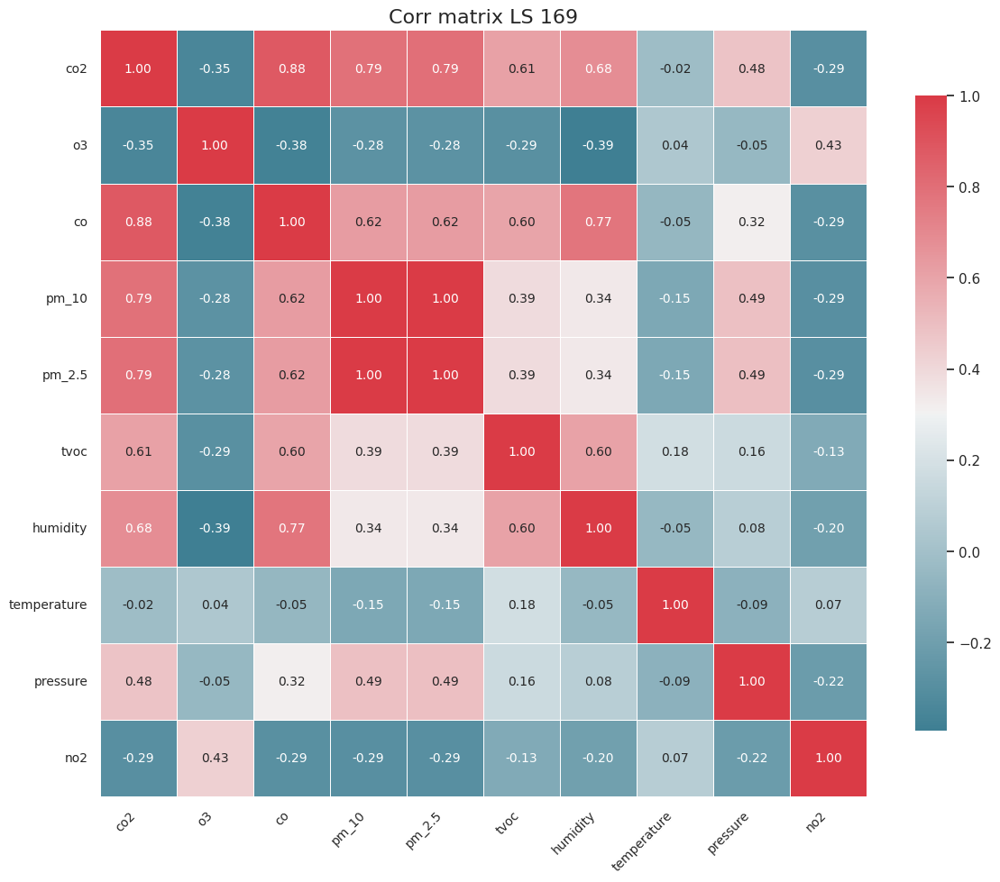

In [4]:
plot_correlation_matrix(df=df_169.corr(),title=f"Corr matrix LS 169")

## PAHs

### Time series plots

In [5]:
plot_experiment_range(df=df_169.resample('240s').mean(),col_names=['pm_10','pm_2.5'],max_value=110)


### Diff plot

In [27]:
plot_experiment_range(df=df_169.resample('240s').mean().diff(),col_names=['pm_10','pm_2.5'])

### diff percentage plot

In [28]:
plot_experiment_range(df=df_169.resample('240s').mean().pct_change() * 100,col_names=['pm_10','pm_2.5'],max_value=100)

## O3 and NO2

### Time Series

In [29]:
plot_experiment_range(df=df_169.resample('240s').mean(),col_names=['o3','no2'],min_value=-50)

### diff plot

In [30]:
plot_experiment_range(df=df_169.resample('240s').mean().pct_change() * 100,col_names=['o3','no2'],max_value=50,min_value=-75)

## CO2 CO

### Time series

In [31]:
plot_experiment_range(df=df_169.resample('240s').mean(),col_names=['co2','co'],max_value=3000)

### diff plot

In [40]:
df_169["co"]["2024-10-20 13:28:00":"2024-10-20 14:28:00"].resample('240s').mean().pct_change()*100

datetime
2024-10-20 13:28:00           NaN
2024-10-20 13:32:00      4.494655
2024-10-20 13:36:00      6.230480
2024-10-20 13:40:00      2.267710
2024-10-20 13:44:00      0.841272
2024-10-20 13:48:00     -0.278123
2024-10-20 13:52:00      1.267309
2024-10-20 13:56:00     -7.141846
2024-10-20 14:00:00   -105.283938
2024-10-20 14:04:00    601.769770
2024-10-20 14:08:00     35.230986
2024-10-20 14:12:00     16.089812
2024-10-20 14:16:00      8.813133
2024-10-20 14:20:00      5.474990
2024-10-20 14:24:00     -2.043894
Freq: 240s, Name: co, dtype: float64

In [42]:
df_169["co"]["2024-10-20 13:28:00":"2024-10-20 14:28:00"].resample('240s').mean()


datetime
2024-10-20 13:28:00    481.266042
2024-10-20 13:32:00    502.897292
2024-10-20 13:36:00    534.230208
2024-10-20 13:40:00    546.345000
2024-10-20 13:44:00    550.941250
2024-10-20 13:48:00    549.408958
2024-10-20 13:52:00    556.371667
2024-10-20 13:56:00    516.636458
2024-10-20 14:00:00    -27.298750
2024-10-20 14:04:00   -191.574375
2024-10-20 14:08:00   -259.067917
2024-10-20 14:12:00   -300.751458
2024-10-20 14:16:00   -327.257083
2024-10-20 14:20:00   -345.174375
2024-10-20 14:24:00   -338.119375
Freq: 240s, Name: co, dtype: float64

In [32]:
plot_experiment_range(df=df_169.resample('240s').mean().pct_change() * 100,col_names=['co2','co'],max_value=1000,min_value=-1000)

## Temperature and Humidity

### time series plot

In [33]:
plot_experiment_range(df=df_169.resample('240s').mean(),col_names=['temperature','humidity'])



## TVOC 

In [34]:
plot_experiment_range(df=df_169.resample('240s').mean(),col_names=['tvoc'])

## Overall analysis

In [35]:
diff_df = transform_diff_avg(df_169.resample('240s').mean())
diff_df.dropna(axis=1,inplace=True)
diff_df

,Doors opened,Hall opened,Indoor Room Air Exchange,Rowing CD,Rowing OD,Human Presence,Diffuser (Water),Diffuser (Oil),Car (3m),Car (5m),Gas Burner (CD),Gas Burner (OD),Candle
co2,-11.073625,-3.793868,-10.563112,5.132014,-21.249595,-0.950830,1.966771,1.242817,-8.554319,-10.661254,7.402583,-10.732392,1.287551
o3,5.191575,3.274514,5.659960,2.326397,2.828014,1.478905,-0.368246,-0.074795,1.959764,4.623586,11.173763,2.951079,-1.346005
co,16.194362,-10.216929,-20.301120,-0.234183,58.463068,-7.415784,-8.994920,-14.148736,147.072044,159.017175,3.631678,69.530995,-43.831751
pm_10,-16.108887,-3.250834,-10.038319,-0.861383,-31.239790,-1.009055,27.571655,45.935049,-60.195215,-47.049237,0.106632,-9.681196,1.098898
pm_2.5,-16.108878,-3.250777,-10.038319,-0.853917,-31.239790,-1.009043,27.539248,44.379255,-59.906649,-46.863954,0.106512,-9.681552,1.098898
tvoc,-5.810194,-2.832865,-6.806514,0.361780,-13.335203,-0.575624,0.859031,4.582679,4.529158,-15.804507,-0.256165,-9.272933,2.424219
humidity,-2.892323,-1.011355,-0.254848,1.415501,-4.710631,-0.465976,0.584496,0.437758,-8.244641,-6.874096,-0.142083,-3.738323,0.701832
temperature,-0.948091,-0.489960,-1.612994,-0.160195,-0.972471,0.082151,0.167380,-0.046775,-0.481930,-0.073838,0.207858,-0.788777,0.373648
pressure,0.001537,0.000919,0.002512,0.004406,0.000132,-0.003446,-0.000082,-0.003681,-0.000289,0.001031,-0.003646,-0.001795,-0.001998
no2,5.173404,2.413305,6.236317,4.297055,1.870275,2.088847,-0.047979,-0.289232,-13.999278,-8.110580,9.510099,9.363358,-1.122203


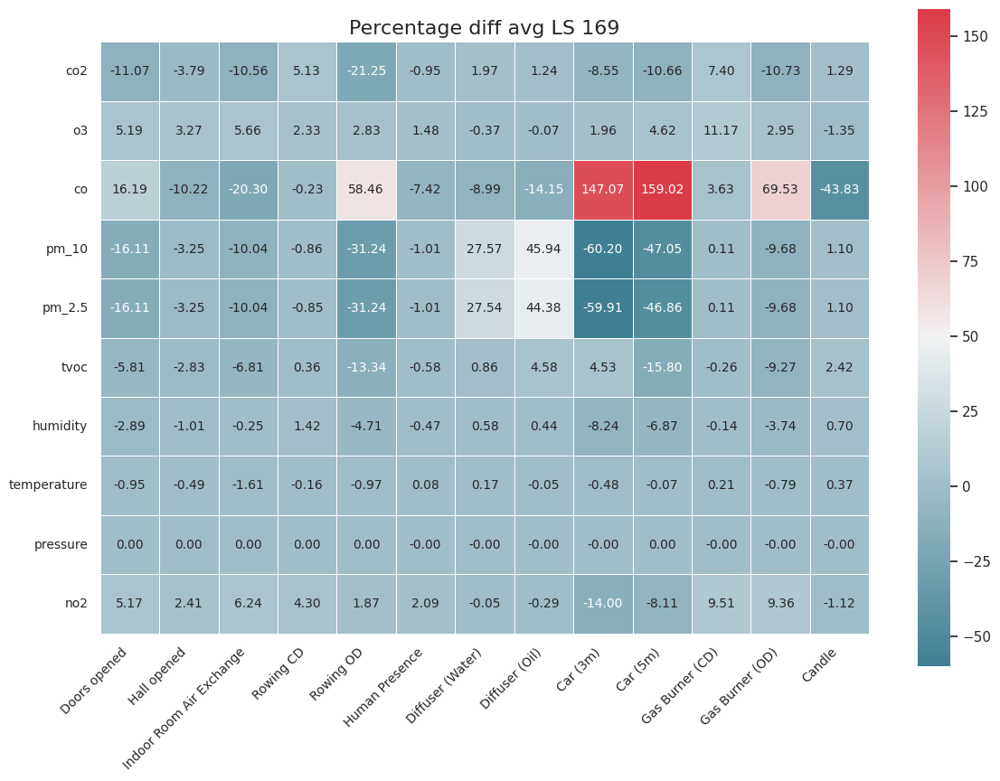

In [36]:
plot_correlation_matrix(diff_df,title="Percentage diff avg LS 169")